## Import

In [2]:
#import 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from IPython.display import display, HTML
from sklearn import preprocessing
% matplotlib inline

In [3]:
#pandas option
pd.set_option('display.width', 1200) #최대가로길이
pd.set_option('display.max_colwidth', 100) #최대탭길이
pd.set_option('float_format', '{:f}'.format) # 숫자형 표기

## Data load

In [4]:
#load 
data1 = pd.read_csv("./ia_channel_master_0-1M.csv",encoding='utf-8')
data2 = pd.read_csv("./ia_channel_master_1-2M.csv",encoding='utf-8')
data3 = pd.read_csv("./ia_channel_master_2-3M.csv",encoding='utf-8')
data4 = pd.read_csv("./ia_channel_master_3-4M.csv",encoding='utf-8')
data5 = pd.read_csv("./ia_channel_master_4-5M.csv",encoding='utf-8')
data6 = pd.read_csv("./ia_channel_master_5-6M.csv",encoding='utf-8')
data7 = pd.read_csv("./ia_channel_master_6-7M.csv",encoding='utf-8')
data8 = pd.read_csv("./ia_channel_master_7-8M.csv",encoding='utf-8')
data9 = pd.read_csv("./ia_channel_master_8-9M.csv",encoding='utf-8')
data10 = pd.read_csv("./ia_channel_master_9-10M.csv",encoding='utf-8')

C:\Users\mediance_ssh\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2714: DtypeWarning:

Columns (5,6,7,12,13,14,25,26,36,38,39) have mixed types. Specify dtype option on import or set low_memory=False.



In [5]:
# data merge
data = pd.concat([data1,data2,data3,data4,data5,data6,data7,data8,data9,data10])

In [6]:
data = data[data['cm_trackdate'].notnull()] # 트레킹안된 데이터 제거

In [7]:
data.shape

(5732982, 41)

## Function

In [8]:
def sigmoid(n):    
    return 1 / (1 + np.exp(-n))

In [9]:
def sigmoid_derivative(n,gradient_L=1, gradient_R=1):
    return sigmoid(n*gradient_L) * (1 - sigmoid(n*gradient_R))

In [10]:
def norm_scaler(data=None):
    if data is None : return None    
    result = (data-data.min()) / (data.max()-data.min())
    result = pd.Series(result).values
    return result

In [11]:
def norm_standard(data=None, bias=0) :
    if data is None : return None    
    result = (data - data.mean(axis=0)*bias) / data.std(axis=0) #평균값조정
    result = pd.Series(result).values
    return result

In [20]:
def scatter(data, x_name, y_name, c_name):
    plt.figure(figsize=(15,10))
    plt.xlabel(x_name)
    plt.ylabel(y_name)
    plt.scatter(data[x_name], data[y_name], c=data[c_name], cmap='viridis', s=3)    
    plt.colorbar()

In [51]:
def scatter3d(data,x_name,y_name,z_name,c_name,info_name) : 
    fig = go.Figure(data=[go.Scatter3d(
        x=data[x_name],
        y=data[y_name],
        z=data[z_name],
        mode='markers',
        marker=dict(
            size=1,
            color=data[c_name],  # set color to an array/list of desired values
            colorscale='Viridis',   # choose a colorscale
            opacity=1,        
        ),
        hovertext=data[info_name]
    )])

    # tight layout
    fig.update_layout(autosize=False,
                      width=1000,
                      height=1000,
                      margin=dict(l=10, r=10, b=10, t=10))
    fig.show()

## Preprocessing

In [35]:
#전체탐색

0 765841 141.90562468188458


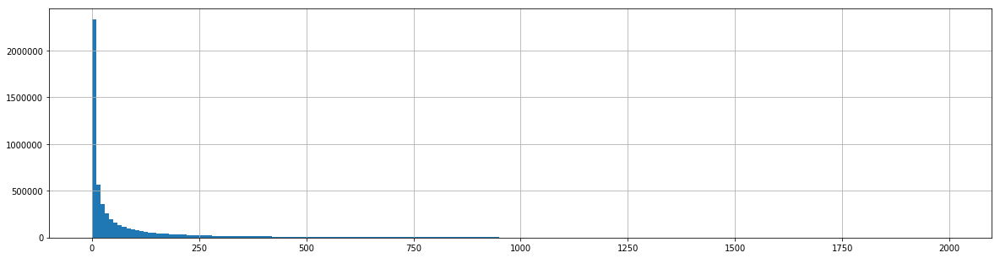

In [31]:
print(data['cm_media_cnt'].min(), data['cm_media_cnt'].max(), data['cm_media_cnt'].mean())
selected = data[data['cm_media_cnt']<2000]
selected['cm_media_cnt'].hist(bins=200, density=False, figsize=(20,5))

0 320580910 1148.1728034380712


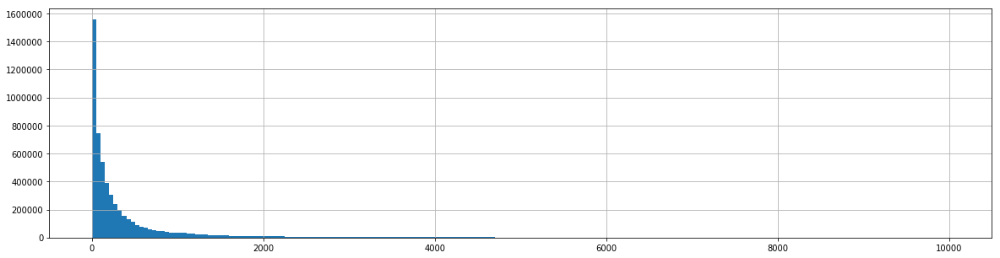

In [32]:
print(data['cm_follower_cnt'].min(), data['cm_follower_cnt'].max(), data['cm_follower_cnt'].mean())
selected = data[data['cm_follower_cnt']<10000]
selected['cm_follower_cnt'].hist(bins=200, density=False, figsize=(20,5))

0 8197 920.1974851831037


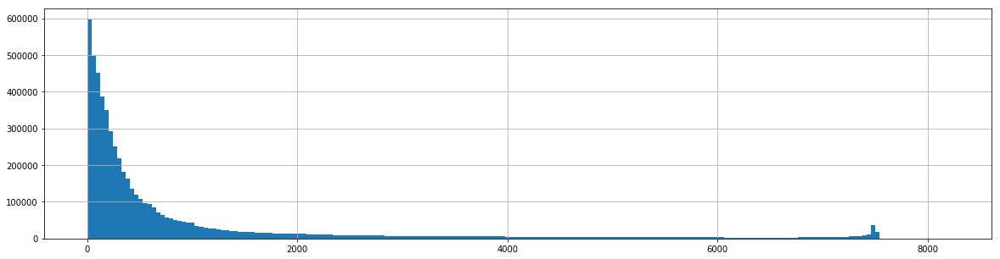

In [33]:
print(data['cm_following_cnt'].min(), data['cm_following_cnt'].max(), data['cm_following_cnt'].mean())
selected = data
selected['cm_following_cnt'].hist(bins=200, density=False, figsize=(20,5))

In [14]:
# followerlist value를 위한.. 
# following/follower/media
data['health_value'] = (data['cm_following_cnt']+1)/(data['cm_follower_cnt']+1)/(data['cm_media_cnt']+1)

In [15]:
'''
목적에따라 데이터 가공을 다르게할 수 있음
최종목적은 fake를 걸러내고 influencer를 정렬해 볼 수 있도록하는것
follower list의 health check가 반영되도록

1.전체기준정규화
2.정규화기준%로 극단 제거
3.중간층 기준으로 탐색
'''

'\n목적에따라 데이터 가공을 다르게할 수 있음\n최종목적은 fake를 걸러내고 influencer를 정렬해 볼 수 있도록하는것\nfollower list의 health check가 반영되도록\n\n1.전체기준정규화\n2.정규화기준%로 극단 제거\n3.중간층 기준으로 탐색\n'

In [16]:
# 조건
'''
1. post적은것 제거 (비활동) 20<정상<5000
2. follower적은것 제거 (비영향력) or 너무높은것 제거(ex.instagram)
3. following 높은것 제거 (봇일가능성)
'''
selected = data[(data['cm_attr_private']==0)&\
                (data['cm_language']=='ko')&\
                (data['cm_media_cnt']>50)&(data['cm_media_cnt']<20000)&\
                (data['cm_follower_cnt']>3000)&(data['cm_follower_cnt']<10000000)] 
# selected = data
print(selected.shape)

(68148, 42)


In [8]:
# standardization (z-score)
# (data-data.mean) / data.std 
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# scaler.fit_transform(data)

# normalize (min-max scalar 0~1)
# (data-data.min) / (data.max-data.min)
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# scaler.fit_transform(data)


## Make selection value

In [57]:
# 영역 세부조정

#초기화
real_score = 0
fake_score = 0


# media x축은 범위, 기준 이동 축비대칭 가능?
# 정규화-액티브펑션의 영역에 맞는것... 
# standardzation? 커스터마이즈 해야함
# 2.sigmoid-미분 함수로 영역설정
# standardzation하고 sigmoid-미분하고 비슷하게 생겼네?
# 구간별 차등가중치는...선형회귀로 가능?

#real
#평균은의미없음, 참고만, followercount 중요
#follower/following 비율
#절대값 조금..
meval=0
frval=0
fwval=0
w1 = 1.2
w2 = 0.1
w3 = 0.2

norm_range = norm_scaler(selected['cm_follower_cnt'])
frval = w1 * -pow(np.log10(sigmoid(norm_range*10)),2)

norm_range = norm_scaler( abs(norm_standard(selected['cm_media_cnt'],1.8)) )
meval = w2 * sigmoid_derivative(norm_range*10)

norm_range = norm_scaler( abs(norm_standard(selected['cm_following_cnt'],0.5)) )
fwval = w3 * sigmoid_derivative(norm_range*6)

real_score = frval+meval+fwval

#fake
#극단쪽만제거 following높은쪽, media적은쪽, follower적은쪽
meval=0
fwval=0
raval=0
w1 = 1
w2 = 0.8
w3 = 1.5

norm_range = norm_scaler( abs(norm_standard(selected['cm_media_cnt'],1.8)) )
meval = w1 * -sigmoid_derivative(norm_range*10)

norm_range = norm_scaler(abs(norm_standard(selected['cm_following_cnt'],0.5)))
fwval = w2 * -sigmoid_derivative(norm_range*7)

norm_range = norm_scaler( norm_standard(selected['cm_following_cnt']/selected['cm_follower_cnt']) )
raval = w3 * sigmoid(norm_range*10) # 팔로잉/팔로워

fake_score = meval+fwval+raval

# follower값이 크게차이나서 민감도증가.. 
selected['score'] = real_score - fake_score
# print(tempval.min(), tempval.max())
print(selected['score'].min(), selected['score'].max())

-1.6062037297515268 -0.23901226525497


C:\Users\mediance_ssh\Anaconda3\lib\site-packages\ipykernel\__main__.py:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [58]:
sample = selected.sample(frac=1)
print(sample.shape)

(68148, 43)


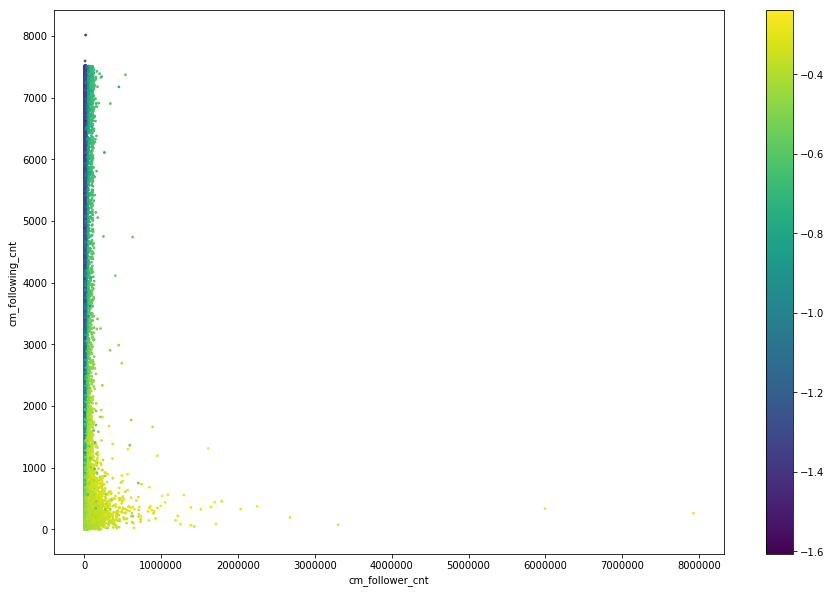

In [59]:
# matplotlib scatter
scatter(sample,'cm_follower_cnt','cm_following_cnt','score')

In [60]:
# 3d scatter
scatter3d(sample,'cm_media_cnt','cm_following_cnt','cm_follower_cnt','score','cm_name')

In [24]:
selected = selected.sort_values(by='score',ascending=0)
# selected = selected.reset_index()

In [25]:
pointer = int(len(sample)*0.0001)
print(pointer,'/',len(selected))
display(HTML(selected[['cm_link','cm_name','cm_media_cnt','cm_follower_cnt','cm_following_cnt','score']][pointer:pointer+30].to_html(index=True)))

3 / 68148


,cm_link,cm_name,cm_media_cnt,cm_follower_cnt,cm_following_cnt,score
243497,https://www.instagram.com/miyayeah/,SUNMI,2050,5994307,334,-0.258757
370111,https://www.instagram.com/sambahong/,hongjinyoung 홍진영,2331,2248710,371,-0.263724
908740,https://www.instagram.com/jangsk83/,장성규,1171,1049585,434,-0.263773
480008,https://www.instagram.com/haneulina/,Ha Neul 하늘,2578,1296561,554,-0.267069
176577,https://www.instagram.com/sora_pppp/,박소라🐶,1870,992085,377,-0.267780
802523,https://www.instagram.com/jungnam_bae/,jungnam bae,1840,565638,1300,-0.269403
67970,https://www.instagram.com/hwa.min/,화민,549,1087626,561,-0.272247
982885,https://www.instagram.com/taeri__taeri/,강태리テリテリ,402,1695857,439,-0.276327
457999,https://www.instagram.com/dj_siena/,DJ SIENA 박시현 park sihyun,1207,562219,634,-0.276529
343139,https://www.instagram.com/soobin1119/,Yang Soo Bin(양수빈),1480,713487,359,-0.279787


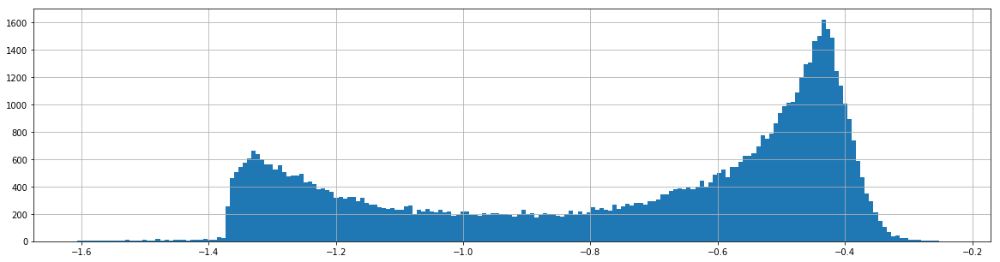

In [55]:
selected['score'].hist(bins=200, density=False, figsize=(20,5))

## Follower list 분석

In [103]:
selected2 = selected[selected['cm_follower_sample'].notnull()] # follower list가 수집된 row
print(selected2.shape)

(66036, 42)


In [104]:
# follower list
cm_follower_sample_list = {'cm_id':selected2['cm_id'],
                           'list':selected2['cm_follower_sample'].str.split(',')}

In [ ]:
# 대략분당 100개
import timeit
followers_value_list = []
starttime = timeit.default_timer()

for i, cmid_list in enumerate(cm_follower_sample_list['list']) : 
    followers = data[data['cm_id'].isin(cmid_list)] # 전체data에서 검색 이게느림    
    followers_value_list.append([cm_follower_sample_list['cm_id'].iloc[i],
                                 followers['cm_media_cnt'].sum(),
                                 followers['cm_follower_cnt'].sum(),
                                 followers['cm_following_cnt'].sum(),
                                 len(followers)])
    
    if int(i%1000)==0 :         
        timecheck = timeit.default_timer() - starttime
        print('======{0}h:{1}m======'.format(int(timecheck/3600), int(timecheck%3600/60)))
        print(len(followers_value_list))
        
print('complete')    

======0h:0m======
1
======0h:13m======
1001


In [ ]:
# follower list 지수는 시간이 오래걸리므로 파일저장을 하는것이 좋겠다

In [179]:
import pickle
def save_pdata(file_path,data) : 
    with open(file_path,'wb') as f: # 
        pickle.dump(data, f)
        f.close
        print('pickle write')

In [178]:
save_pdata('./followers_value_list.pickle',followers_value_list)

pickle write


In [180]:
# file load
def load_pdata(file_path) :
    with open(file_path, 'rb') as f :        
        return pickle.load(f)

In [256]:
temp_pdata = load_pdata('./followers_value_list.pickle')

In [171]:
print(followers_value_list[0])

[1545312511, 0.12867038415143767]


In [ ]:
'''
follower list value_avg 값이 높을수록 fake 비중이 높다는 가설(조정필요)
기존 score값에 가중치 넣어서 절대값으로 적용
노멀라이징 필요 0-1
'''

In [260]:
temp_df = pd.DataFrame(temp_pdata)

In [318]:
selected2['follower_value'] = temp_df[1] # 배열 index 값에 맞춰서 입력됨

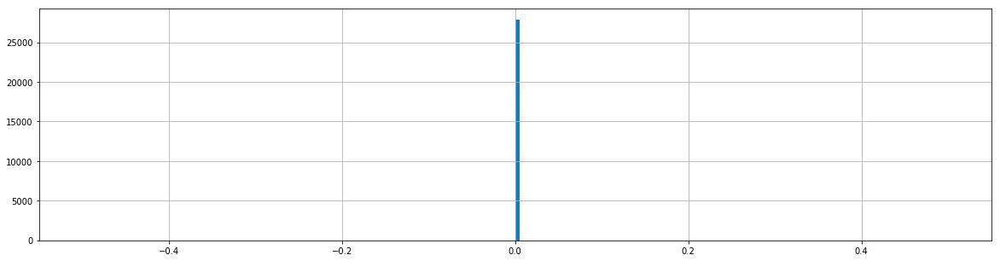

In [316]:
selected2['follower_value'].hist(bins=200, density=False, figsize=(20,5))

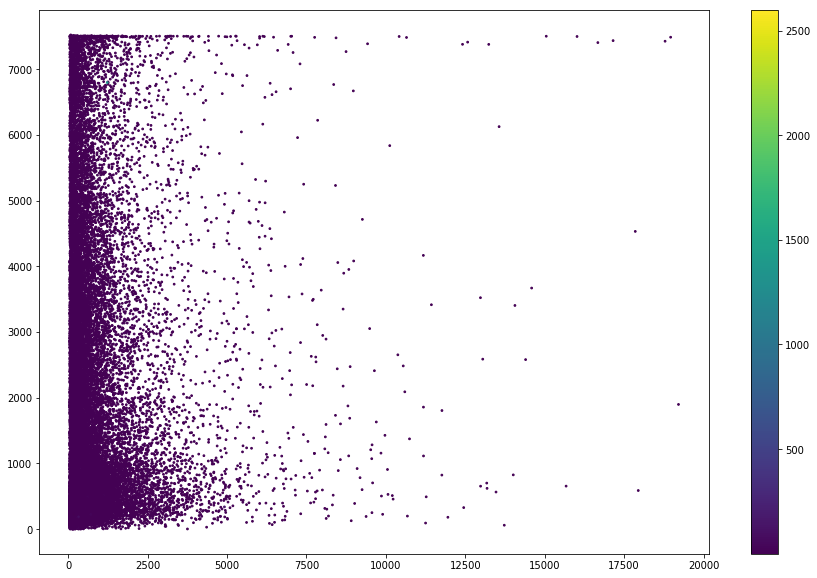

In [309]:
scatter(selected2,'cm_media_cnt','cm_following_cnt','follower_value')

In [310]:
scatter3d(selected2,'cm_media_cnt','cm_following_cnt','cm_follower_cnt','follower_value','cm_name')